In [ ]:
# Mounting Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Installing required package to handle fcs data
! pip install fcsy
! pip install flowcytometrytools

     |████████████████████████████████| 7.1 MB 5.2 MB/s 
     |████████████████████████████████| 5.0 MB 45.6 MB/s 


In [ ]:

# Importing required Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from fcsy import DataFrame
import FlowCytometryTools
from FlowCytometryTools import test_data_dir, test_data_file
from FlowCytometryTools import FCMeasurement
from FlowCytometryTools import ThresholdGate, PolyGate
from sklearn.metrics import mean_squared_error
from sklearn import metrics
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn import preprocessing
from sklearn.metrics import silhouette_score,calinski_harabasz_score,davies_bouldin_score
import pickle
import statsmodels.api as sm
import matplotlib.patheffects as PathEffects
sns.set()
import warnings
warnings.filterwarnings('ignore')
import plotly as py
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import mpl_toolkits.mplot3d.axes3d as p3
from matplotlib import animation

%matplotlib inline
import colorlover as cl
from plotly.offline import plot
import plotly.graph_objs as go

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
# Importing Data # Reading Dataset(fcs format)
data1 = DataFrame.from_fcs('/content/drive/MyDrive/Cytometry/ML Project/AA1168_Mix1_C1.32035.fcs', channel_type='multi')
data2 = DataFrame.from_fcs('/content/drive/MyDrive/Cytometry/ML Project/Specimen_001_XT0141_005.605757.fcs', channel_type='multi')
print(' Data 1 shape : {} , Data type : {} \n Data 2 shape : {} , Data type : {}'.format(data1.shape,type(data1),data2.shape,type(data2)))

 Data 1 shape : (51812, 8) , Data type : <class 'fcsy.DataFrame'> 
 Data 2 shape : (300000, 17) , Data type : <class 'fcsy.DataFrame'>


In [ ]:
# converting fcs format to dataframe
data1 = pd.DataFrame(data1)
data2 = pd.DataFrame(data2)
print(' Data 1 shape : {} , Data type : {} \n Data 2 shape : {} , Data type : {}'.format(data1.shape,type(data1),data2.shape,type(data2)))

 Data 1 shape : (51812, 8) , Data type : <class 'pandas.core.frame.DataFrame'> 
 Data 2 shape : (300000, 17) , Data type : <class 'pandas.core.frame.DataFrame'>


In [ ]:
data1.head()

short,FSC-A,SSC-A,ALEXA 488-A,ALEXA 350-A,ALEXA 750-A,PE-A,ALEXA 647-A,Time
long,,,,,,,,
0,21471.119141,4921.560059,12.960001,212.400009,0.000000,-18.799999,-1.940000,0.0
1,43539.757812,73998.359375,41.040001,4717.440430,178.480011,77.080002,62.080002,0.1
2,20720.480469,28576.800781,16.200001,83.520004,496.640015,25.379999,36.860001,0.1
3,82162.960938,64777.324219,73.440002,211.680008,221.160004,212.440002,103.790001,0.1
4,143799.046875,81612.359375,35.640003,556.559998,6798.729980,106.220001,454.930023,0.1


In [ ]:
data2.head()

short,FSC-A,FSC-H,FSC-W,SSC-A,SSC-H,SSC-W,FITC-A,Alexa Fluor 700-A,APC-eFluor780-A,V500-A,eFluor450-A,APC-A,PerCP-Cy5-5-A,PE-Cy7-A,BV650-A,PE-A,Time
long,,,,,,,CD25,CD3,CD4,LD,CD45RA,CD14,CCR7,CD19,CD8,CD56,
0,81213.859375,60287.0,88284.890625,17399.201172,12063.0,94526.570312,404.040009,1339.599976,3243.600098,2237.020020,8366.440430,359.720001,4229.680176,14791.140625,288.600006,851.400024,10.4
1,62029.242188,48986.0,82985.921875,16130.660156,13934.0,75867.593750,251.160004,10231.280273,13005.000000,2180.040039,10448.799805,1440.239990,6324.500000,1172.180054,562.400024,42.139999,10.5
2,5025.930176,5417.0,60804.750000,4668.300293,6333.0,48309.136719,33.670002,-108.120003,-38.080002,47.360001,-37.740002,18.360001,-15.470000,4.300000,34.779999,33.540001,10.5
3,73410.609375,56388.0,85320.242188,21208.460938,16592.0,83770.351562,594.230042,22195.880859,28566.121094,3142.780029,13877.219727,3143.640137,11279.450195,2371.020020,925.739990,17.200001,10.5
4,79933.492188,60990.0,85891.476562,23055.759766,20442.0,73915.578125,283.920013,17793.560547,23762.599609,2373.919922,9299.580078,2861.439941,9297.470703,1985.739990,520.960022,110.080002,10.5


**FCS file header have unique short and long names format seperated by comma which is need to be converted to standard dataframe format before processing further**



In [ ]:
print(' Data 1 columns : {} \n Data 2 columns : {}'.format(set(data1.columns),set(data2.columns)))

 Data 1 columns : {('ALEXA 350-A', ' '), ('ALEXA 647-A', ' '), ('ALEXA 750-A', ' '), ('ALEXA 488-A', ' '), ('PE-A', ' '), ('FSC-A', ' '), ('SSC-A', ' '), ('Time', ' ')} 
 Data 2 columns : {('Time', ' '), ('FITC-A', 'CD25'), ('PE-A', 'CD56'), ('V500-A', 'LD'), ('eFluor450-A', 'CD45RA'), ('PerCP-Cy5-5-A', 'CCR7'), ('FSC-W', ' '), ('FSC-H', ' '), ('PE-Cy7-A', 'CD19'), ('APC-A', 'CD14'), ('APC-eFluor780-A', 'CD4'), ('Alexa Fluor 700-A', 'CD3'), ('FSC-A', ' '), ('SSC-A', ' '), ('SSC-H', ' '), ('SSC-W', ' '), ('BV650-A', 'CD8')}


In [ ]:
data1.columns = ['FSC-A',  'SSC-A', 'ALEXA 488-A', 'ALEXA 350-A', 'PE-A', 'ALEXA 750-A', 'ALEXA 647-A', 'Time']
data1.head()

,FSC-A,SSC-A,ALEXA 488-A,ALEXA 350-A,PE-A,ALEXA 750-A,ALEXA 647-A,Time
0,21471.119141,4921.560059,12.960001,212.400009,0.000000,-18.799999,-1.940000,0.0
1,43539.757812,73998.359375,41.040001,4717.440430,178.480011,77.080002,62.080002,0.1
2,20720.480469,28576.800781,16.200001,83.520004,496.640015,25.379999,36.860001,0.1
3,82162.960938,64777.324219,73.440002,211.680008,221.160004,212.440002,103.790001,0.1
4,143799.046875,81612.359375,35.640003,556.559998,6798.729980,106.220001,454.930023,0.1


In [ ]:
data2.columns = ['FSC-A', 'FSC-H', 'FSC-W', 'SSC-A', 'SSC-H', 'SSC-W', 'APC-A', 'Alexa Fluor 700-A', 'APC-eFluor 780-A', 'V500-A', 'FITC-A', 'PE-A', 'PerCP-Cy5-5-A', 'PE-Cy7-A', 'eFluor 450-A', 'BV650-A', 'Time']
data2.head()

,FSC-A,FSC-H,FSC-W,SSC-A,SSC-H,SSC-W,APC-A,Alexa Fluor 700-A,APC-eFluor 780-A,V500-A,FITC-A,PE-A,PerCP-Cy5-5-A,PE-Cy7-A,eFluor 450-A,BV650-A,Time
0,81213.859375,60287.0,88284.890625,17399.201172,12063.0,94526.570312,404.040009,1339.599976,3243.600098,2237.020020,8366.440430,359.720001,4229.680176,14791.140625,288.600006,851.400024,10.4
1,62029.242188,48986.0,82985.921875,16130.660156,13934.0,75867.593750,251.160004,10231.280273,13005.000000,2180.040039,10448.799805,1440.239990,6324.500000,1172.180054,562.400024,42.139999,10.5
2,5025.930176,5417.0,60804.750000,4668.300293,6333.0,48309.136719,33.670002,-108.120003,-38.080002,47.360001,-37.740002,18.360001,-15.470000,4.300000,34.779999,33.540001,10.5
3,73410.609375,56388.0,85320.242188,21208.460938,16592.0,83770.351562,594.230042,22195.880859,28566.121094,3142.780029,13877.219727,3143.640137,11279.450195,2371.020020,925.739990,17.200001,10.5
4,79933.492188,60990.0,85891.476562,23055.759766,20442.0,73915.578125,283.920013,17793.560547,23762.599609,2373.919922,9299.580078,2861.439941,9297.470703,1985.739990,520.960022,110.080002,10.5


In [ ]:
# Removing extra markers

l = []
all = []

for i in data1.columns:
    # print(i[0][-1])
  if(i[-1] != 'H' and i[-1] != 'W' and i != 'Time'):
    l.append(i)
  # df.rename(columns = {i:i[0]}, inplace = True)  
#   all.append(i)
# print(all)
l
data1= data1[l]
data1 =data1
print(data1.shape)

(51812, 7)


In [ ]:

# Removing extra markers in data 2
a = []
all = []

for i in data2.columns:
    # print(i[0][-1])
  if(i[-1] != 'H' and i[-1] != 'W' and i != 'Time'):
    a.append(i)
a
data2= data2[a]
data2 =data2
print(data2.shape)

(300000, 12)


In [ ]:
print(' Data 1 shape : {} , Data type : {} \n Data 2 shape : {} , Data type : {}'.format(data1.shape,type(data1),data2.shape,type(data2)))
print(' Data 1 columns : {} \n Data 2 columns : {}'.format(set(data1.columns),set(data2.columns)))

 Data 1 shape : (51812, 7) , Data type : <class 'pandas.core.frame.DataFrame'> 
 Data 2 shape : (300000, 12) , Data type : <class 'pandas.core.frame.DataFrame'>
 Data 1 columns : {'ALEXA 647-A', 'ALEXA 488-A', 'SSC-A', 'ALEXA 350-A', 'ALEXA 750-A', 'PE-A', 'FSC-A'} 
 Data 2 columns : {'SSC-A', 'FITC-A', 'PE-A', 'PerCP-Cy5-5-A', 'BV650-A', 'APC-eFluor 780-A', 'Alexa Fluor 700-A', 'APC-A', 'eFluor 450-A', 'V500-A', 'FSC-A', 'PE-Cy7-A'}


In [ ]:
print('Data 1 :',data1.isna().sum(),',\n\n'
'Data 2:', data2.isna().sum())

Data 1 : FSC-A          0
SSC-A          0
ALEXA 488-A    0
ALEXA 350-A    0
PE-A           0
ALEXA 750-A    0
ALEXA 647-A    0
dtype: int64 ,

Data 2: FSC-A                0
SSC-A                0
APC-A                0
Alexa Fluor 700-A    0
APC-eFluor 780-A     0
V500-A               0
FITC-A               0
PE-A                 0
PerCP-Cy5-5-A        0
PE-Cy7-A             0
eFluor 450-A         0
BV650-A              0
dtype: int64


In [ ]:
data1.describe().T 

,count,mean,std,min,25%,50%,75%,max
FSC-A,51812.0,130521.281250,72601.132812,3394.159912,84000.841797,130088.199219,179592.375000,262143.000000
SSC-A,51812.0,105958.257812,59094.562500,-187.920013,78333.751953,106955.640625,135941.765625,262143.000000
ALEXA 488-A,51812.0,68.533997,83.709328,-110.160004,32.400002,62.640003,92.880005,5732.640137
ALEXA 350-A,51812.0,3414.482910,8931.823242,-104.400002,91.440002,294.480011,2087.460022,262143.000000
PE-A,51812.0,3107.937256,8335.399414,-111.550003,172.660004,355.020020,2100.050049,262143.000000
ALEXA 750-A,51812.0,264.576508,328.621368,-75.199997,120.320000,200.220001,311.139984,15963.080078
ALEXA 647-A,51812.0,364.220337,478.638489,-65.959999,130.949997,291.000000,483.060028,20971.400391


In [ ]:
data2.describe().T

,count,mean,std,min,25%,50%,75%,max
FSC-A,300000.0,78225.554688,43828.710938,4091.360107,57639.629883,78998.921875,98449.492188,262143.000000
SSC-A,300000.0,30390.335938,21868.167969,798.070007,16761.291016,23726.431641,38108.980469,262143.000000
APC-A,300000.0,539.337219,838.726929,-275.730011,258.440002,470.470001,724.360046,262143.000000
Alexa Fluor 700-A,300000.0,10764.061523,9650.926758,-699.720032,556.919983,11732.040039,17222.359375,262143.000000
APC-eFluor 780-A,300000.0,9889.002930,10045.886719,-578.679993,949.960022,6647.000000,17911.199219,262143.000000
V500-A,300000.0,2876.580322,3313.284912,-368.520020,1132.940063,2410.179932,3830.979980,262143.000000
FITC-A,300000.0,9782.792969,12755.418945,-702.260010,952.380005,4010.060059,14936.345215,262143.000000
PE-A,300000.0,7512.329590,10914.269531,-546.039978,274.720001,2482.679932,11460.889893,262143.000000
PerCP-Cy5-5-A,300000.0,3808.292725,4347.610352,-798.070007,506.870026,1824.550049,6778.590332,262143.000000
PE-Cy7-A,300000.0,2132.220703,5772.030273,-403.339996,208.980011,818.720032,1641.739990,262143.000000


In [ ]:
#  converting to csv file
# data1.to_csv('Data.csv' , index = False)
# df1 = pd.read_csv('data_csv.csv')
# df1

In [ ]:
# data =himani.apply(pd.to_numeric)
# data.columns
# # data_csv.head[1,1]

In [ ]:
data1_dbscan = data1
data2_dbscan = data2

In [ ]:
data1_dbscan.head()

,FSC-A,SSC-A,ALEXA 488-A,ALEXA 350-A,PE-A,ALEXA 750-A,ALEXA 647-A
0,21471.119141,4921.560059,12.960001,212.400009,0.000000,-18.799999,-1.940000
1,43539.757812,73998.359375,41.040001,4717.440430,178.480011,77.080002,62.080002
2,20720.480469,28576.800781,16.200001,83.520004,496.640015,25.379999,36.860001
3,82162.960938,64777.324219,73.440002,211.680008,221.160004,212.440002,103.790001
4,143799.046875,81612.359375,35.640003,556.559998,6798.729980,106.220001,454.930023


In [ ]:
def dbscan_clustering(x_set):
    
    X = x_set
    min_samples = X.shape[1]

    range_eps = [90,95,100,105]
    for i in range_eps:
        print("eps value is: "+str(i))
        db = DBSCAN(eps=i, min_samples=min_samples, metric='euclidean').fit(X)
        core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
        core_samples_mask[db.core_sample_indices_] = True
        labels = db.labels_
        print(set(labels))
        #silhouette_avg = silhouette_score(X, labels)
        
        #silhouette_score = 
        print('kmeans silhouette_score : {}'.format(silhouette_score(X, labels, metric='cosine')))
        #calinski_harabasz_score = 
        print('kmeans Calinski Score : {}'.format(calinski_harabasz_score(X, labels)))
        #davies_bouldin_score = 
        print('kmeans Davies Bouldin Score : {}'.format(davies_bouldin_score(X, labels)))
        print("For eps value ="+str(i), labels)
        print('number of cluster ',np.unique(labels).size,'\n')
    return

In [ ]:
dbscan_clustering(data1)

eps value is: 90
{0, -1}
kmeans silhouette_score : -0.20094168186187744
kmeans Calinski Score : 20.45606527873633
kmeans Davies Bouldin Score : 0.48043503841186497
For eps value =90 [-1 -1 -1 ... -1 -1 -1]
number of cluster  2 

eps value is: 95
{0, 1, 2, 3, 4, -1}
kmeans silhouette_score : -0.21550250053405762
kmeans Calinski Score : 24.236604533847924
kmeans Davies Bouldin Score : 0.47918564547739256
For eps value =95 [-1 -1 -1 ... -1 -1 -1]
number of cluster  6 

eps value is: 100
{0, 1, 2, 3, 4, 5, 6, 7, -1}
kmeans silhouette_score : -0.2150653451681137
kmeans Calinski Score : 24.056360097218562
kmeans Davies Bouldin Score : 0.5064810558067752
For eps value =100 [-1 -1 -1 ... -1 -1 -1]
number of cluster  9 

eps value is: 105
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, -1}
kmeans silhouette_score : -0.21335609257221222
kmeans Calinski Score : 27.259120108400726
kmeans Davies Bouldin Score : 0.678127385657095
For eps value =105 [-1 -1 -1 ... -1 -1 -1]
number of cluster  13 



In [ ]:
min_samples = data1_dbscan.shape[1]
dbscan = DBSCAN(eps=95, min_samples=min_samples).fit(data1_dbscan)
set(dbscan.labels_)
labels = dbscan.labels_
print(np.unique(dbscan.labels_).size)
data1['label']=  labels

6


In [ ]:
data1.head()

,FSC-A,SSC-A,ALEXA 488-A,ALEXA 350-A,PE-A,ALEXA 750-A,ALEXA 647-A,label
0,21471.119141,4921.560059,12.960001,212.400009,0.000000,-18.799999,-1.940000,-1
1,43539.757812,73998.359375,41.040001,4717.440430,178.480011,77.080002,62.080002,-1
2,20720.480469,28576.800781,16.200001,83.520004,496.640015,25.379999,36.860001,-1
3,82162.960938,64777.324219,73.440002,211.680008,221.160004,212.440002,103.790001,-1
4,143799.046875,81612.359375,35.640003,556.559998,6798.729980,106.220001,454.930023,-1


No handles with labels found to put in legend.


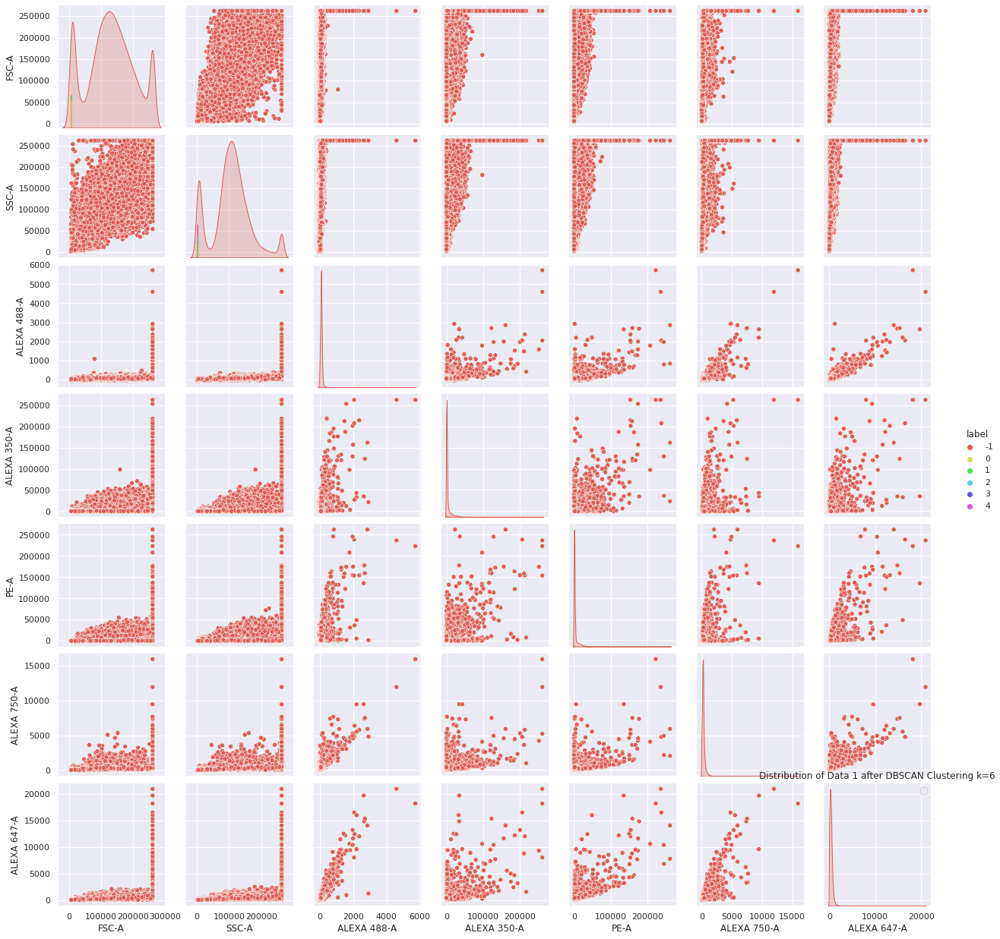

In [ ]:
color = palette=sns.hls_palette(6)
sns.pairplot(data1,hue = 'label', palette=color)
plt.title('Distribution of Data 1 after DBSCAN Clustering k=6')
plt.legend()
plt.show()

In [ ]:




# def prepare_tsne(n_components, data, labels):
#     names = ['x', 'y', 'z']
#     matrix = TSNE(n_components=n_components).fit_transform(data1)
#     df_matrix = pd.DataFrame(matrix)
#     df_matrix.rename({i:names[i] for i in range(n_components)}, axis=1, inplace=True)
#     df_matrix['labels'] = labels
    
#     return df_matrix

# def plot_3d(df, name='labels'):
#     iris = px.data.iris()
#     fig = px.scatter_3d(df, x='x', y='y', z='z',
#                   color=name, opacity=0.5)
    

#     fig.update_traces(marker=dict(size=3))
#     fig.show()
    
# def plot_animation(df, label_column, name):
#     def update(num):
#         ax.view_init(200, num)

#     N=360
#     fig = plt.figure()
#     ax = fig.add_subplot(111, projection='3d')
#     ax.scatter(tsne_3d_df['x'], tsne_3d_df['y'], tsne_3d_df['z'], c=tsne_3d_df[label_column],
#                s=6, depthshade=True, cmap='Paired')
#     ax.set_zlim(-15, 25)
#     ax.set_xlim(-20, 20)
#     plt.tight_layout()
#     ani = animation.FuncAnimation(fig, update, N, blit=False, interval=50)
#     ani.save('{}.gif'.format(name), writer='imagemagick')
#     plt.show()

In [ ]:
from sklearn.manifold import TSNE
import plotly.express as px

df = data1

features = df.loc[:, :'label']

tsne = TSNE(n_components=3, random_state=0)
projections = tsne.fit_transform(features, )

fig = px.scatter_3d(
    projections, x=0, y=1, z=2,
    color=df.label, labels={'color': 'label'}
)
fig.update_traces(marker_size=8)
fig.show()

In [ ]:
fig.write_html("file.html")

In [ ]:
data1.head()

,FSC-A,SSC-A,ALEXA 488-A,ALEXA 350-A,PE-A,ALEXA 750-A,ALEXA 647-A
0,21471.119141,4921.560059,12.960001,212.400009,0.000000,-18.799999,-1.940000
1,43539.757812,73998.359375,41.040001,4717.440430,178.480011,77.080002,62.080002
2,20720.480469,28576.800781,16.200001,83.520004,496.640015,25.379999,36.860001
3,82162.960938,64777.324219,73.440002,211.680008,221.160004,212.440002,103.790001
4,143799.046875,81612.359375,35.640003,556.559998,6798.729980,106.220001,454.930023


In [ ]:
#best_eps2(data1)

eps value is: 0.1


In [ ]:
def best_eps2(x_set):
    
    X = x_set
    min_samples = X.shape[1]+1

    range_eps = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9,1,10,50,60,70,80,90,100,105,110,111,112,113,114,115,120,130,140,150,200,300,500,1000]
    for i in range_eps:
        print("eps value is: "+str(i))
        db = DBSCAN(eps=i, min_samples=min_samples, metric='euclidean').fit(X)
        core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
        core_samples_mask[db.core_sample_indices_] = True
        labels = db.labels_
        print(set(labels))
        #silhouette_avg = silhouette_score(X, labels)
        print("For eps value ="+str(i), labels)
        print('number of cluster ',np.unique(labels).size)
    return

In [ ]:
best_eps2(data2)

eps value is: 0.1
{-1}
For eps value =0.1 [-1 -1 -1 ... -1 -1 -1]
number of cluster  1
eps value is: 0.2
{-1}
For eps value =0.2 [-1 -1 -1 ... -1 -1 -1]
number of cluster  1
eps value is: 0.3
{-1}
For eps value =0.3 [-1 -1 -1 ... -1 -1 -1]
number of cluster  1
eps value is: 0.4
{-1}
For eps value =0.4 [-1 -1 -1 ... -1 -1 -1]
number of cluster  1
eps value is: 0.5
{-1}
For eps value =0.5 [-1 -1 -1 ... -1 -1 -1]
number of cluster  1
eps value is: 0.6
{-1}
For eps value =0.6 [-1 -1 -1 ... -1 -1 -1]
number of cluster  1
eps value is: 0.7
{-1}
For eps value =0.7 [-1 -1 -1 ... -1 -1 -1]
number of cluster  1
eps value is: 0.8
{-1}
For eps value =0.8 [-1 -1 -1 ... -1 -1 -1]
number of cluster  1
eps value is: 0.9
{-1}
For eps value =0.9 [-1 -1 -1 ... -1 -1 -1]
number of cluster  1
eps value is: 1
{-1}
For eps value =1 [-1 -1 -1 ... -1 -1 -1]
number of cluster  1
eps value is: 10
{-1}
For eps value =10 [-1 -1 -1 ... -1 -1 -1]
number of cluster  1
eps value is: 50
{-1}
For eps value =50 [-1 -1 -1

In [ ]:
silhouette_score(data1_dbscan, labels, metric='cosine')

0.2487492

In [ ]:
def dbscan_clustering(x_set):
    
    X = x_set
    min_samples = X.shape[1]

    range_eps = [125,130,131,132,133]
    for i in range_eps:
        print("eps value is: "+str(i))
        db = DBSCAN(eps=i, min_samples=min_samples, metric='euclidean').fit(X)
        core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
        core_samples_mask[db.core_sample_indices_] = True
        labels = db.labels_
        print(set(labels))
        #silhouette_avg = silhouette_score(X, labels)
        
        #silhouette_score = 
        print('kmeans silhouette_score : {}'.format(silhouette_score(X, labels, metric='cosine')))
        #calinski_harabasz_score = 
        print('kmeans Calinski Score : {}'.format(calinski_harabasz_score(X, labels)))
        #davies_bouldin_score = 
        print('kmeans Davies Bouldin Score : {}'.format(davies_bouldin_score(X, labels)))
        print("For eps value ="+str(i), labels)
        print('number of cluster ',np.unique(labels).size,'\n')
    return

In [ ]:
dbscan_clustering(data2)

eps value is: 125
{0, 1, -1}
kmeans silhouette_score : -0.16295653581619263
kmeans Calinski Score : 22.30563751609236
kmeans Davies Bouldin Score : 0.6540987386029985
For eps value =125 [-1 -1 -1 ... -1 -1 -1]
number of cluster  3 

eps value is: 130
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, -1}
kmeans silhouette_score : -0.32909291982650757
kmeans Calinski Score : 26.067432411474954
kmeans Davies Bouldin Score : 0.8670385187597766
For eps value =130 [-1 -1 -1 ... -1 -1 -1]
number of cluster  15 

eps value is: 131
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, -1}
kmeans silhouette_score : -0.3297489285469055
kmeans Calinski Score : 27.740580525238414
kmeans Davies Bouldin Score : 0.9410813543268762
For eps value =131 [-1 -1 -1 ... -1 -1 -1]
number of cluster  19 

eps value is: 132
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, -1}
kmeans silhouette_score : -0.3296501040458679
kmeans Calinski Score : 30.14046738206851
kmeans Davies Bouldin Score :

In [ ]:
# eps=125 , Data 2, DBSCAN
min_samples = data2_dbscan.shape[1]+1 
dbscan = DBSCAN(eps=130, min_samples=min_samples).fit(data2_dbscan)

labels = dbscan.labels_
#data1_kmeans.loc[:,'predicted_labels']= dbscan.labels_
n_clusters = np.unique(dbscan.labels_).size
print('Number of clusters are ',set(dbscan.labels_))
print('There are total {} clusters and the total samples in each cluster are {}:'.format(n_clusters,pd.Series(dbscan.labels_).value_counts()))
silhouette_score = silhouette_score(data2_dbscan, labels)
print('kmeans silhouette_score : {}'.format(silhouette_score))
calinski_harabasz_score = calinski_harabasz_score(data2_dbscan, labels)
print('kmeans Calinski Score : {}'.format(calinski_harabasz_score))
davies_bouldin_score = davies_bouldin_score(data2_dbscan, labels)
print('kmeans Davies Bouldin Score : {}'.format(davies_bouldin_score))

Number of clusters are  {0, 1, 2, 3, 4, -1}
There are total 6 clusters and the total samples in each cluster are -1    299916
 4        22
 3        20
 1        15
 2        14
 0        13
dtype: int64:


TypeError: ignored

In [ ]:
data1_kmeans.head()

,FSC-A,SSC-A,ALEXA 488-A,ALEXA 350-A,PE-A,ALEXA 750-A,ALEXA 647-A
0,9.058173,7.585090,1.680867,4.442319,0.000000,0.000000,0.000000
1,9.765139,10.295507,2.801947,7.542731,4.268382,3.429603,3.213751
2,9.022588,9.344060,1.891727,3.509690,5.291600,2.327235,2.695405
3,10.400169,10.162420,3.381335,4.438924,4.482724,4.442507,3.726659
4,10.959882,10.393445,2.662062,5.405504,7.908200,3.749775,5.203883


In [ ]:
data1.head()

,FSC-A,SSC-A,ALEXA 488-A,ALEXA 350-A,PE-A,ALEXA 750-A,ALEXA 647-A
0,9.058173,7.585090,1.680867,4.442319,0.000000,0.000000,0.000000
1,9.765139,10.295507,2.801947,7.542731,4.268382,3.429603,3.213751
2,9.022588,9.344060,1.891727,3.509690,5.291600,2.327235,2.695405
3,10.400169,10.162420,3.381335,4.438924,4.482724,4.442507,3.726659
4,10.959882,10.393445,2.662062,5.405504,7.908200,3.749775,5.203883


In [ ]:
# number of cluster =5 , Data 1, k-means
n_clusters=5
normalized_vectors1 = preprocessing.normalize(data1_kmeans)
kmeans = KMeans(n_clusters, max_iter=500)
kmeans.fit(normalized_vectors1)
labels_kmeans = kmeans.labels_
#data1_kmeans.loc[:,'predicted_labels']= kmeans.labels_
print('Number of clusters are ',set(labels_kmeans))
print('There are total {} clusters and the total samples in each cluster are {}:'.format(n_clusters,pd.Series(kmeans.labels_).value_counts()))
silhouette_score = silhouette_score(normalized_vectors1, labels_kmeans, metric='cosine')
print('kmeans silhouette_score : {}'.format(silhouette_score))
calinski_harabasz_score = calinski_harabasz_score(normalized_vectors1, labels_kmeans)
print('kmeans Calinski Score : {}'.format(calinski_harabasz_score))
davies_bouldin_score = davies_bouldin_score(normalized_vectors1, labels_kmeans)
print('kmeans Davies Bouldin Score : {}'.format(davies_bouldin_score))

Number of clusters are  {0, 1, 2, 3, 4}
There are total 5 clusters and the total samples in each cluster are 0    16236
3    14519
4     8903
2     8532
1     3622
dtype: int64:
kmeans silhouette_score : 0.421859472990036
kmeans Calinski Score : 89467.28027395837
kmeans Davies Bouldin Score : 0.8095324549569616


In [ ]:
# number of cluster =6 , Data 1, k-means
n_clusters=6
normalized_vectors1 = preprocessing.normalize(data1_kmeans)
kmeans = KMeans(n_clusters, max_iter=500)
kmeans.fit(normalized_vectors1)
labels_kmeans = kmeans.labels_
#data1_kmeans.loc[:,'predicted_labels']= kmeans.labels_
print('Number of clusters are ',set(labels_kmeans))
print('There are total {} clusters and the total samples in each cluster are {}:'.format(n_clusters,pd.Series(kmeans.labels_).value_counts()))
silhouette_score = silhouette_score(normalized_vectors1, labels_kmeans, metric='cosine')
print('kmeans silhouette_score : {}'.format(silhouette_score))
calinski_harabasz_score = calinski_harabasz_score(normalized_vectors1, labels_kmeans)
print('kmeans Calinski Score : {}'.format(calinski_harabasz_score))
davies_bouldin_score = davies_bouldin_score(normalized_vectors1, labels_kmeans)
print('kmeans Davies Bouldin Score : {}'.format(davies_bouldin_score))

Number of clusters are  {0, 1, 2, 3, 4, 5}
There are total 6 clusters and the total samples in each cluster are 5    13284
4    10956
2     8497
3     8063
1     7557
0     3455
dtype: int64:
kmeans silhouette_score : 0.4208810329437256
kmeans Calinski Score : 86645.2719954457
kmeans Davies Bouldin Score : 0.8304708612388453


In [ ]:
# number of cluster =7 , Data 1, k-means
n_clusters=7
normalized_vectors1 = preprocessing.normalize(data1_kmeans)
kmeans = KMeans(n_clusters, max_iter=500)
kmeans.fit(normalized_vectors1)
labels_kmeans = kmeans.labels_
#data1_kmeans.loc[:,'predicted_labels']= kmeans.labels_
print('Number of clusters are ',set(labels_kmeans))
print('There are total {} clusters and the total samples in each cluster are {}:'.format(n_clusters,pd.Series(kmeans.labels_).value_counts()))
silhouette_score = silhouette_score(normalized_vectors1, labels_kmeans, metric='cosine')
print('kmeans silhouette_score : {}'.format(silhouette_score))
calinski_harabasz_score = calinski_harabasz_score(normalized_vectors1, labels_kmeans)
print('kmeans Calinski Score : {}'.format(calinski_harabasz_score))
davies_bouldin_score = davies_bouldin_score(normalized_vectors1, labels_kmeans)
print('kmeans Davies Bouldin Score : {}'.format(davies_bouldin_score))

Number of clusters are  {0, 1, 2, 3, 4, 5, 6}
There are total 7 clusters and the total samples in each cluster are 1    10148
5     9927
2     8452
6     8422
4     6475
3     5392
0     2996
dtype: int64:
kmeans silhouette_score : 0.4003353714942932
kmeans Calinski Score : 84912.18436329628
kmeans Davies Bouldin Score : 0.8415169217450676


In [ ]:
# number of cluster =8 , Data 1, k-means
n_clusters=8
normalized_vectors1 = preprocessing.normalize(data1_kmeans)
kmeans = KMeans(n_clusters, max_iter=500)
kmeans.fit(normalized_vectors1)
labels_kmeans = kmeans.labels_
#data1_kmeans.loc[:,'predicted_labels']= kmeans.labels_
print('Number of clusters are ',set(labels_kmeans))
print('There are total {} clusters and the total samples in each cluster are {}:'.format(n_clusters,pd.Series(kmeans.labels_).value_counts()))
silhouette_score = silhouette_score(normalized_vectors1, labels_kmeans, metric='cosine')
print('kmeans silhouette_score : {}'.format(silhouette_score))
calinski_harabasz_score = calinski_harabasz_score(normalized_vectors1, labels_kmeans)
print('kmeans Calinski Score : {}'.format(calinski_harabasz_score))
davies_bouldin_score = davies_bouldin_score(normalized_vectors1, labels_kmeans)
print('kmeans Davies Bouldin Score : {}'.format(davies_bouldin_score))

Number of clusters are  {0, 1, 2, 3, 4, 5, 6, 7}
There are total 8 clusters and the total samples in each cluster are 7    9779
2    8365
6    8044
0    6443
4    6339
5    5427
1    4516
3    2899
dtype: int64:
kmeans silhouette_score : 0.39846083521842957
kmeans Calinski Score : 82862.89125096865
kmeans Davies Bouldin Score : 0.8576988467869633


In [ ]:
# number of cluster =9 , Data 1, k-means
n_clusters=9
normalized_vectors1 = preprocessing.normalize(data1_kmeans)
kmeans = KMeans(n_clusters, max_iter=500)
kmeans.fit(normalized_vectors1)
labels_kmeans = kmeans.labels_
#data1_kmeans.loc[:,'predicted_labels']= kmeans.labels_
print('Number of clusters are ',set(labels_kmeans))
print('There are total {} clusters and the total samples in each cluster are {}:'.format(n_clusters,pd.Series(kmeans.labels_).value_counts()))
silhouette_score = silhouette_score(normalized_vectors1, labels_kmeans, metric='cosine')
print('kmeans silhouette_score : {}'.format(silhouette_score))
calinski_harabasz_score = calinski_harabasz_score(normalized_vectors1, labels_kmeans)
print('kmeans Calinski Score : {}'.format(calinski_harabasz_score))
davies_bouldin_score = davies_bouldin_score(normalized_vectors1, labels_kmeans)
print('kmeans Davies Bouldin Score : {}'.format(davies_bouldin_score))

Number of clusters are  {0, 1, 2, 3, 4, 5, 6, 7, 8}
There are total 9 clusters and the total samples in each cluster are 1    8357
5    7843
0    7196
3    6596
6    6503
4    4869
8    4271
2    3520
7    2657
dtype: int64:
kmeans silhouette_score : 0.3872980773448944
kmeans Calinski Score : 80090.61417262364
kmeans Davies Bouldin Score : 0.8417709810420071


No handles with labels found to put in legend.


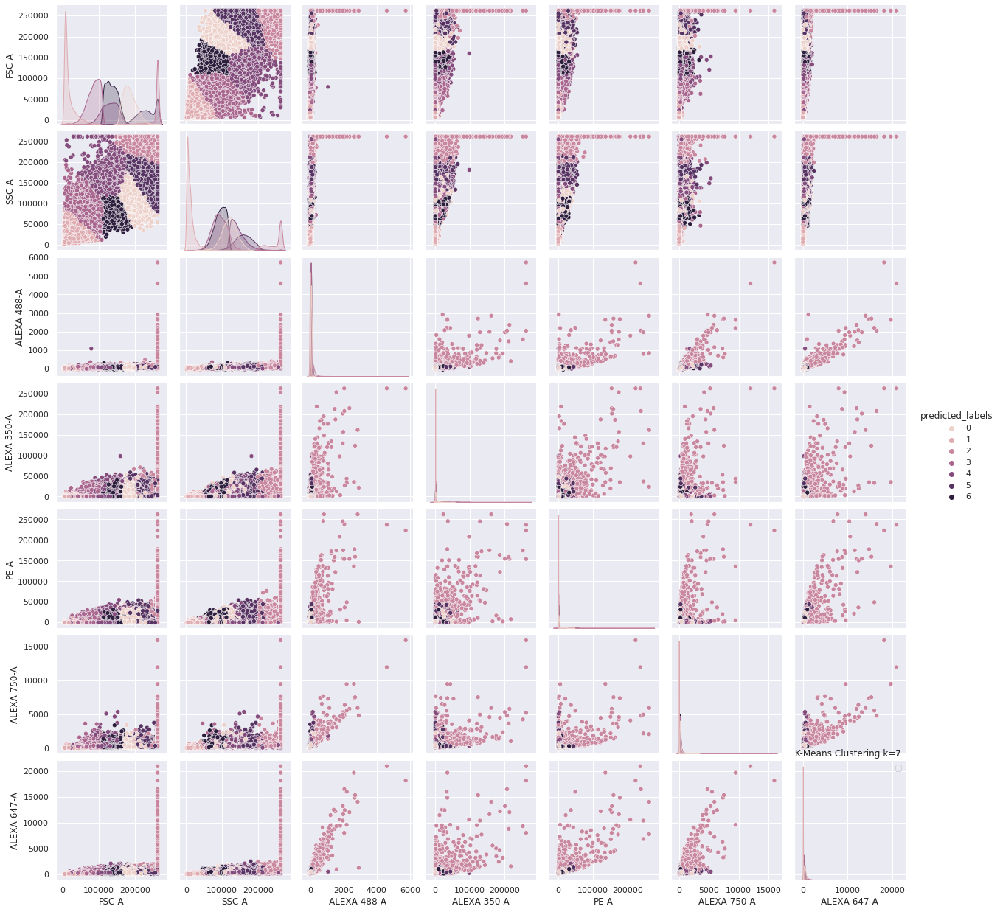

In [ ]:
# # scatter plot for data distribution after clustering
# sns.pairplot(data1_kmeans,hue = 'predicted_labels')
# plt.title("K-Means Clustering k=7 ")
# plt.legend()
# plt.show()

No handles with labels found to put in legend.


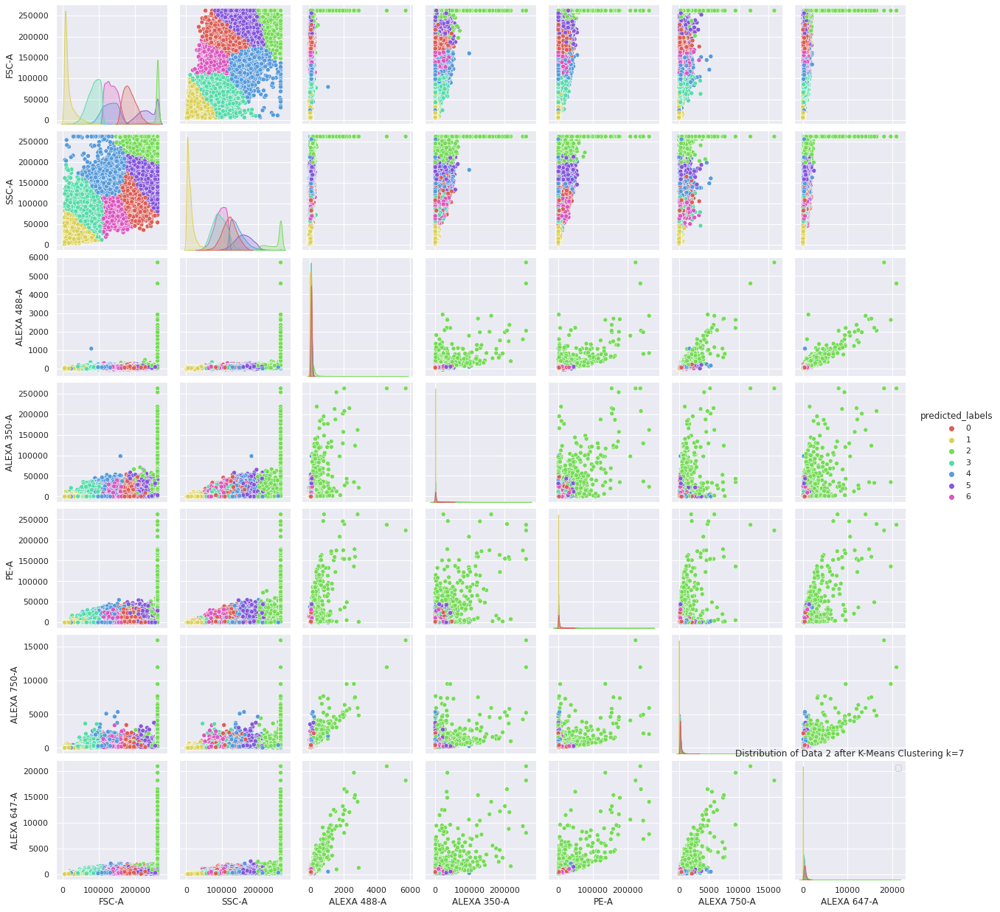

In [ ]:
# # scatter plot for data distribution in data 1 after clustering
# color = palette=sns.hls_palette(7)
# sns.pairplot(data1_kmeans,hue = 'predicted_labels', palette=color)
# plt.title('Distribution of Data 2 after K-Means Clustering k=7')
# plt.legend()
# plt.show()

In [ ]:
# number of cluster =4 , Data 1,  k-means
K=4
normalized_vectors1 = preprocessing.normalize(data1_kmeans)
kmeans = KMeans(n_clusters, max_iter=500)
kmeans.fit(normalized_vectors1)
labels_kmeans = kmeans.labels_
normalized_vectors1.loc[:,'predicted_labels']= kmeans.labels_
print('Number of clusters are ',set(labels_kmeans))
print('There are total {} clusters and the total samples in each cluster are {}:'.format(n_clusters,pd.Series(kmeans.labels_).value_counts()))
silhouette_score = silhouette_score(normalized_vectors1, labels_kmeans, metric='cosine')
print('kmeans silhouette_score : {}'.format(silhouette_score))
calinski_harabasz_score = calinski_harabasz_score(normalized_vectors1, labels_kmeans)
print('kmeans Calinski Score : {}'.format(calinski_harabasz_score))
davies_bouldin_score = davies_bouldin_score(normalized_vectors1, labels_kmeans)
print('kmeans Davies Bouldin Score : {}'.format(davies_bouldin_score))

[5 6 2 ... 5 1 4]
no of cluster {0, 1, 2, 3, 4, 5, 6}
There are total seven clusters which contains total samples : 1    69730
4    55642
2    52460
5    46898
0    39785
6    29273
3     6212
dtype: int64


In [ ]:
data2_kmeans.shape

(300000, 13)

No handles with labels found to put in legend.


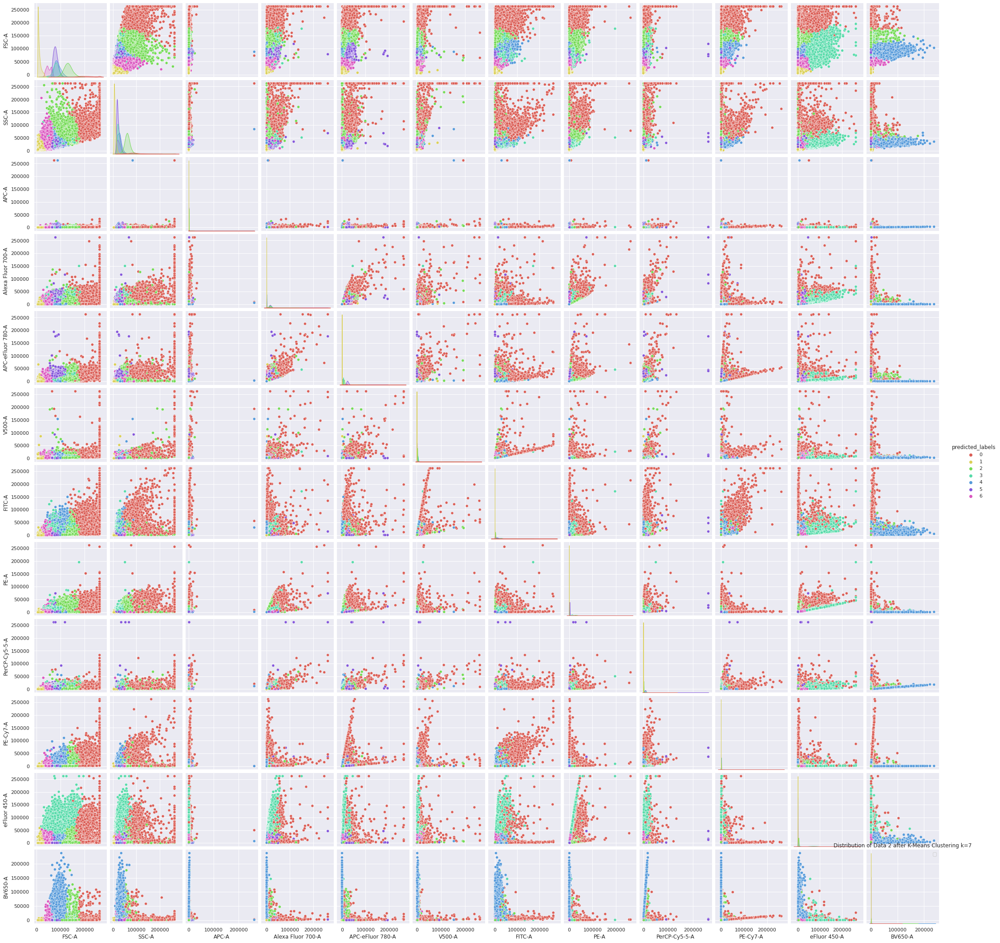

In [ ]:
# scatter plot for data distribution in data 1 after clustering
color = palette=sns.hls_palette(4)
sns.pairplot(normalized_vectors1,hue = 'predicted_labels', palette=color)
plt.title('Distribution of Data 1 after K-Means Clustering k=4')
plt.legend()
plt.show()

In [ ]:
centroids = kmeans.cluster_centers_
centroids.shape

(7, 8)

In [ ]:
cen_1 = [i[0] for i in centroids] 
cen_2 = [i[1] for i in centroids]
cen_3 = [i[2] for i in centroids] 
cen_4 = [i[3] for i in centroids]
cen_5 = [i[4] for i in centroids] 
cen_6 = [i[5] for i in centroids]
cen_7 = [i[6] for i in centroids] 
cen_8 = [i[7] for i in centroids] 

In [ ]:
cen_1

[232881.3368079014,
 84481.56893701959,
 17889.537379361936,
 131457.27173896236,
 185275.76240091352,
 135005.37092988897,
 257163.66432970815]

In [ ]:
# data1_kmeans['cen_1'] = data1_kmeans.predicted_labels.map({0:cen_1[0], 1:cen_1[1], 2:cen_1[2], 3:cen_1[3], 4:cen_1[4], 5:cen_1[5], 6:cen_1[6], 7:cen_1[2]})
# data1_kmeans['cen_2'] = data1_kmeans.predicted_labels.map({0:cen_2[0], 1:cen_2[1], 2:cen_2[2], 3:cen_2[3], 4:cen_2[4], 5:cen_2[5], 6:cen_2[6], 7:cen_2[2]})
# data1_kmeans['cen_3'] = data1_kmeans.predicted_labels.map({0:cen_3[0], 1:cen_3[1], 2:cen_3[2], 3:cen_3[3], 4:cen_3[4], 5:cen_3[5], 6:cen_3[6], 7:cen_3[2]})
# data1_kmeans['cen_4'] = data1_kmeans.predicted_labels.map({0:cen_4[0], 1:cen_4[1], 2:cen_4[2], 3:cen_4[3], 4:cen_4[4], 5:cen_4[5], 6:cen_4[6], 7:cen_4[2]})
# data1_kmeans['cen_5'] = data1_kmeans.predicted_labels.map({0:cen_5[0], 1:cen_5[1], 2:cen_5[2], 3:cen_5[3], 4:cen_5[4], 5:cen_5[5], 6:cen_5[6], 7:cen_5[2]})
# data1_kmeans['cen_6'] = data1_kmeans.predicted_labels.map({0:cen_6[0], 1:cen_6[1], 2:cen_6[2], 3:cen_6[3], 4:cen_6[4], 5:cen_6[5], 6:cen_6[6], 7:cen_6[2]})
# data1_kmeans['cen_7'] = data1_kmeans.predicted_labels.map({0:cen_7[0], 1:cen_7[1], 2:cen_7[2], 3:cen_7[3], 4:cen_7[4], 5:cen_7[5], 6:cen_7[6], 7:cen_7[2]})
# data1_kmeans['cen_8'] = data1_kmeans.predicted_labels.map({0:cen_8[0], 1:cen_8[1], 2:cen_8[2], 3:cen_8[3], 4:cen_8[4], 5:cen_8[5], 6:cen_8[6], 7:cen_8[2]})

In [ ]:
# data1_kmeans['c'] = data1_kmeans.predicted_labels.map

TypeError: ignored

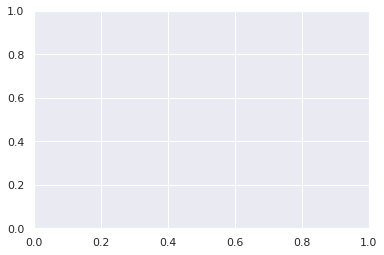

In [ ]:
# import matplotlib.pyplot as plt
# plt.scatter(data1_kmeans['FSC-A'],data1_kmeans['SSC-A'], c=data1_kmeans.c, alpha = 0.6, s=10)

In [ ]:
# # number of cluster =4 , k-means
# K=4
# kmeans = KMeans(n_clusters=4, max_iter=500)
# kmeans.fit(data1_kmeans)
# print(kmeans.labels_)
# data1_kmeans.loc[:,'predicted_labels']= kmeans.labels_
# print('no of cluster',set(data1_kmeans['predicted_labels']))
# print('There are total seven clusters which contains total samples :',pd.Series(kmeans.labels_).value_counts())

[0 0 0 ... 2 3 1]
no of cluster {0, 1, 2, 3}
There are total seven clusters which contains total samples : 3    21124
1    16428
0     8730
2     5530
dtype: int64


In [ ]:
data1_kmeans.shape, data1_kmeans.head()

((51812, 17),
            FSC-A         SSC-A  ALEXA 488-A  ALEXA 350-A         PE-A  \
 0   21471.119141   4921.560059    12.960001   212.400009     0.000000   
 1   43539.757812  73998.359375    41.040001  4717.440430   178.480011   
 2   20720.480469  28576.800781    16.200001    83.520004   496.640015   
 3   82162.960938  64777.324219    73.440002   211.680008   221.160004   
 4  143799.046875  81612.359375    35.640003   556.559998  6798.729980   
 
    ALEXA 750-A  ALEXA 647-A  predicted_labels          cen_1         cen_2  \
 0   -18.799999    -1.940000                 2   17889.537379  11698.680263   
 1    77.080002    62.080002                 1   84481.568937  92689.525390   
 2    25.379999    36.860001                 2   17889.537379  11698.680263   
 3   212.440002   103.790001                 1   84481.568937  92689.525390   
 4   106.220001   454.930023                 5  135005.370930  93944.548908   
 
        cen_3        cen_4        cen_5       cen_6       cen_7 

In [ ]:
# kmeans = KMeans(n_clusters=4, max_iter=100)
# kmeans.fit(data1)

KMeans(max_iter=100, n_clusters=4)

In [ ]:
# pd.Series(kmeans.labels_).value_counts()

3    21124
1    16428
0     8730
2     5530
dtype: int64

In [ ]:
# data1["cluster"] = kmeans.fit_predict(data1)

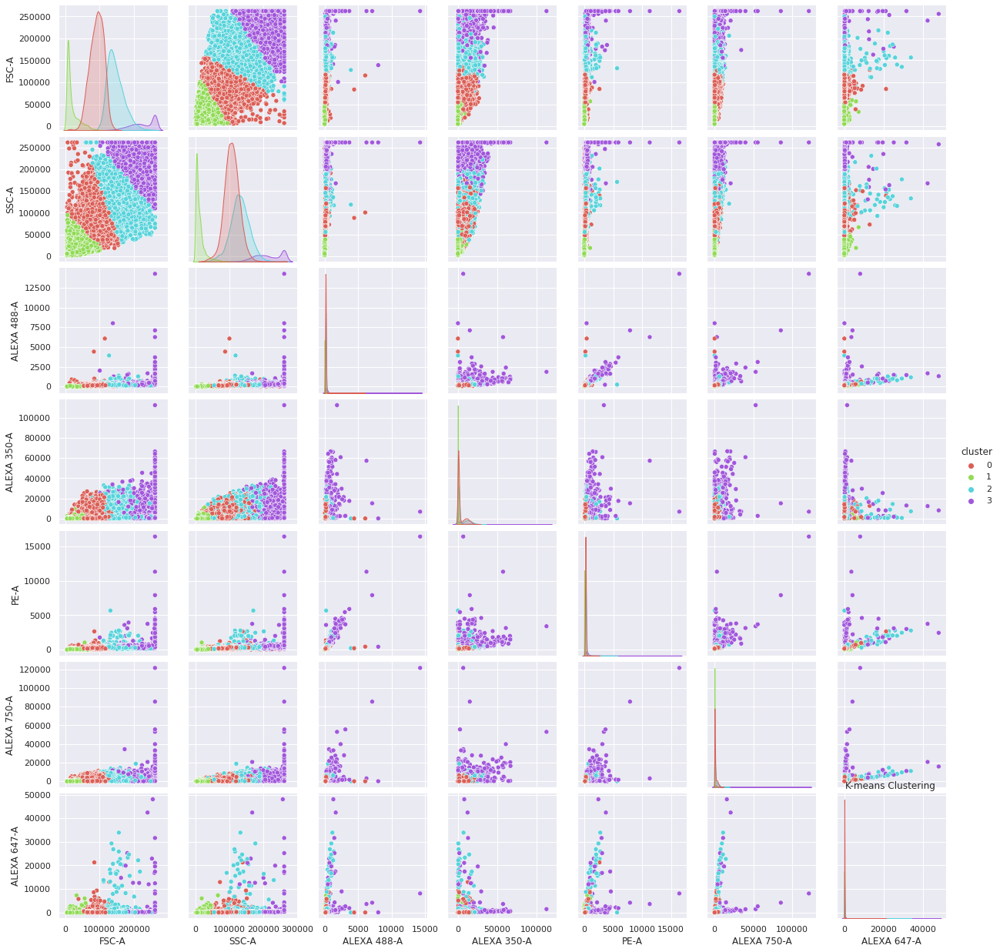

In [ ]:
# # results = pd.DataFrame(himani,columns=['ALEXA 488-A','FSC-A'])
# himani["cluster"] = KMeans(n_clusters=4, max_iter=10).fit_predict(data)
# sns.pairplot(himani, hue= "cluster",palette=sns.hls_palette(4))
# # sns.scatterplot(x="ALEXA 488-A", y="FSC-A", hue= "cluster", data=himani)
# plt.title('K-means Clustering ')
# plt.show()

In [ ]:
# definiing transformation function(hyperbolic sine function)
def transformation_function(x, scale=5):
	return np.log((x / scale) + np.sqrt((x / scale)**2 + 1))

In [ ]:
# Defining attibutes in the Dataset
markers1 = list(data1)[0:] 
markers2 = list(data2)[0:] 
print('The number of markers present in datset 1 are',markers1)
print('The number of markers present in datset 2 are',markers2)

The number of markers present in datset 1 are ['FSC-A', 'SSC-A', 'ALEXA 488-A', 'ALEXA 350-A', 'PE-A', 'ALEXA 750-A', 'ALEXA 647-A']
The number of markers present in datset 2 are ['FSC-A', 'SSC-A', 'APC-A', 'Alexa Fluor 700-A', 'APC-eFluor 780-A', 'V500-A', 'FITC-A', 'PE-A', 'PerCP-Cy5-5-A', 'PE-Cy7-A', 'eFluor 450-A', 'BV650-A']


In [ ]:
data1.head()

,FSC-A,SSC-A,ALEXA 488-A,ALEXA 350-A,PE-A,ALEXA 750-A,ALEXA 647-A
0,21471.119141,4921.560059,12.960001,212.400009,0.000000,-18.799999,-1.940000
1,43539.757812,73998.359375,41.040001,4717.440430,178.480011,77.080002,62.080002
2,20720.480469,28576.800781,16.200001,83.520004,496.640015,25.379999,36.860001
3,82162.960938,64777.324219,73.440002,211.680008,221.160004,212.440002,103.790001
4,143799.046875,81612.359375,35.640003,556.559998,6798.729980,106.220001,454.930023


In [ ]:
data1_kmeans.head()

,FSC-A,SSC-A,ALEXA 488-A,ALEXA 350-A,PE-A,ALEXA 750-A,ALEXA 647-A
0,21471.119141,4921.560059,12.960001,212.400009,0.000000,-18.799999,-1.940000
1,43539.757812,73998.359375,41.040001,4717.440430,178.480011,77.080002,62.080002
2,20720.480469,28576.800781,16.200001,83.520004,496.640015,25.379999,36.860001
3,82162.960938,64777.324219,73.440002,211.680008,221.160004,212.440002,103.790001
4,143799.046875,81612.359375,35.640003,556.559998,6798.729980,106.220001,454.930023


In [ ]:
# Data transformation with the defined transformation sine function
data1[markers1] = transformation_function(data1[markers1])
data1[data1[markers1] < 0] = 0 

In [ ]:
print('Transformed Dataset:','\n')
data1.head()

Transformed Dataset: 



,FSC-A,SSC-A,ALEXA 488-A,ALEXA 350-A,PE-A,ALEXA 750-A,ALEXA 647-A
0,9.058173,7.585090,1.680867,4.442319,0.000000,0.000000,0.000000
1,9.765139,10.295507,2.801947,7.542731,4.268382,3.429603,3.213751
2,9.022588,9.344060,1.891727,3.509690,5.291600,2.327235,2.695405
3,10.400169,10.162420,3.381335,4.438924,4.482724,4.442507,3.726659
4,10.959882,10.393445,2.662062,5.405504,7.908200,3.749775,5.203883


In [ ]:
data1_kmeans.head()

,FSC-A,SSC-A,ALEXA 488-A,ALEXA 350-A,PE-A,ALEXA 750-A,ALEXA 647-A
0,9.058173,7.585090,1.680867,4.442319,0.000000,0.000000,0.000000
1,9.765139,10.295507,2.801947,7.542731,4.268382,3.429603,3.213751
2,9.022588,9.344060,1.891727,3.509690,5.291600,2.327235,2.695405
3,10.400169,10.162420,3.381335,4.438924,4.482724,4.442507,3.726659
4,10.959882,10.393445,2.662062,5.405504,7.908200,3.749775,5.203883


In [ ]:
# number of cluster =4 , Data 1, k-means , tranformed data
n_clusters=4
normalized_vectors1 = preprocessing.normalize(data1)
kmeans = KMeans(n_clusters, max_iter=500)
kmeans.fit(normalized_vectors1)
labels_kmeans = kmeans.labels_
#data1_kmeans.loc[:,'predicted_labels']= kmeans.labels_
print('Number of clusters are ',set(labels_kmeans))
print('There are total {} clusters and the total samples in each cluster are {}:'.format(n_clusters,pd.Series(kmeans.labels_).value_counts()))
silhouette_score = silhouette_score(normalized_vectors1, labels_kmeans, metric='cosine')
print('kmeans silhouette_score : {}'.format(silhouette_score))
calinski_harabasz_score = calinski_harabasz_score(normalized_vectors1, labels_kmeans)
print('kmeans Calinski Score : {}'.format(calinski_harabasz_score))
davies_bouldin_score = davies_bouldin_score(normalized_vectors1, labels_kmeans)
print('kmeans Davies Bouldin Score : {}'.format(davies_bouldin_score))

Number of cluster {0, 1, 2, 3}
There are total 4 clusters and the total samples in each cluster are 1    22607
3    11066
0    10694
2     7445
dtype: int64:
kmeans silhouette_score : 0.3154449462890625
kmeans Calinski Score : 35252.02020302445
kmeans Davies Bouldin Score : 1.0299771441720351


In [ ]:
# number of cluster =5 , Data 1, k-means, tranformed data
n_clusters=5
normalized_vectors1 = preprocessing.normalize(data1)
kmeans = KMeans(n_clusters, max_iter=500)
kmeans.fit(normalized_vectors1)
labels_kmeans = kmeans.labels_
#data1_kmeans.loc[:,'predicted_labels']= kmeans.labels_
print('Number of clusters are ',set(labels_kmeans))
print('There are total {} clusters and the total samples in each cluster are {}:'.format(n_clusters,pd.Series(kmeans.labels_).value_counts()))
silhouette_score = silhouette_score(normalized_vectors1, labels_kmeans, metric='cosine')
print('kmeans silhouette_score : {}'.format(silhouette_score))
calinski_harabasz_score = calinski_harabasz_score(normalized_vectors1, labels_kmeans)
print('kmeans Calinski Score : {}'.format(calinski_harabasz_score))
davies_bouldin_score = davies_bouldin_score(normalized_vectors1, labels_kmeans)
print('kmeans Davies Bouldin Score : {}'.format(davies_bouldin_score))

Number of cluster {0, 1, 2, 3, 4}
There are total 5 clusters and the total samples in each cluster are 0    15854
4    10346
3     9272
1     9004
2     7336
dtype: int64:
kmeans silhouette_score : 0.2896428406238556
kmeans Calinski Score : 32081.322137319876
kmeans Davies Bouldin Score : 1.125187423333426


In [ ]:
# number of cluster =6 , Data 1, k-means, tranformed data
n_clusters=6
normalized_vectors1 = preprocessing.normalize(data1)
kmeans = KMeans(n_clusters, max_iter=500)
kmeans.fit(normalized_vectors1)
labels_kmeans = kmeans.labels_
#data1_kmeans.loc[:,'predicted_labels']= kmeans.labels_
print('Number of clusters are ',set(labels_kmeans))
print('There are total {} clusters and the total samples in each cluster are {}:'.format(n_clusters,pd.Series(kmeans.labels_).value_counts()))
silhouette_score = silhouette_score(normalized_vectors1, labels_kmeans, metric='cosine')
print('kmeans silhouette_score : {}'.format(silhouette_score))
calinski_harabasz_score = calinski_harabasz_score(normalized_vectors1, labels_kmeans)
print('kmeans Calinski Score : {}'.format(calinski_harabasz_score))
davies_bouldin_score = davies_bouldin_score(normalized_vectors1, labels_kmeans)
print('kmeans Davies Bouldin Score : {}'.format(davies_bouldin_score))

Number of cluster {0, 1, 2, 3, 4, 5}
There are total 6 clusters and the total samples in each cluster are 0    15303
5    10046
2     9060
3     8960
1     4637
4     3806
dtype: int64:
kmeans silhouette_score : 0.2764759361743927
kmeans Calinski Score : 29838.257730267378
kmeans Davies Bouldin Score : 1.2750396341961252


In [ ]:
# number of cluster =7 , Data 1, k-means, tranformed data
n_clusters=7
normalized_vectors1 = preprocessing.normalize(data1)
kmeans = KMeans(n_clusters, max_iter=500)
kmeans.fit(normalized_vectors1)
labels_kmeans = kmeans.labels_
#data1_kmeans.loc[:,'predicted_labels']= kmeans.labels_
print('Number of clusters are ',set(labels_kmeans))
print('There are total {} clusters and the total samples in each cluster are {}:'.format(n_clusters,pd.Series(kmeans.labels_).value_counts()))
silhouette_score = silhouette_score(normalized_vectors1, labels_kmeans, metric='cosine')
print('kmeans silhouette_score : {}'.format(silhouette_score))
calinski_harabasz_score = calinski_harabasz_score(normalized_vectors1, labels_kmeans)
print('kmeans Calinski Score : {}'.format(calinski_harabasz_score))
davies_bouldin_score = davies_bouldin_score(normalized_vectors1, labels_kmeans)
print('kmeans Davies Bouldin Score : {}'.format(davies_bouldin_score))

Number of cluster {0, 1, 2, 3, 4, 5, 6}
There are total 7 clusters and the total samples in each cluster are 3    15238
4     8744
2     7980
5     7047
0     4561
1     4438
6     3804
dtype: int64:
kmeans silhouette_score : 0.27185797691345215
kmeans Calinski Score : 27395.843790904506
kmeans Davies Bouldin Score : 1.2666629727276593


In [ ]:
# number of cluster =8 , Data 1, k-means, tranformed data
n_clusters=8
normalized_vectors1 = preprocessing.normalize(data1)
kmeans = KMeans(n_clusters, max_iter=500)
kmeans.fit(normalized_vectors1)
labels_kmeans = kmeans.labels_
#data1_kmeans.loc[:,'predicted_labels']= kmeans.labels_
print('Number of clusters are ',set(labels_kmeans))
print('There are total {} clusters and the total samples in each cluster are {}:'.format(n_clusters,pd.Series(kmeans.labels_).value_counts()))
silhouette_score = silhouette_score(normalized_vectors1, labels_kmeans, metric='cosine')
print('kmeans silhouette_score : {}'.format(silhouette_score))
calinski_harabasz_score = calinski_harabasz_score(normalized_vectors1, labels_kmeans)
print('kmeans Calinski Score : {}'.format(calinski_harabasz_score))
davies_bouldin_score = davies_bouldin_score(normalized_vectors1, labels_kmeans)
print('kmeans Davies Bouldin Score : {}'.format(davies_bouldin_score))

Number of cluster {0, 1, 2, 3, 4, 5, 6, 7}
There are total 8 clusters and the total samples in each cluster are 4    9412
5    8627
1    8158
0    6661
7    6562
6    4518
3    4196
2    3678
dtype: int64:
kmeans silhouette_score : 0.24004104733467102
kmeans Calinski Score : 25405.24179698555
kmeans Davies Bouldin Score : 1.3476958759808686


In [ ]:
# number of cluster =9 , Data 1, k-means, tranformed data
n_clusters=9
normalized_vectors1 = preprocessing.normalize(data1)
kmeans = KMeans(n_clusters, max_iter=500)
kmeans.fit(normalized_vectors1)
labels_kmeans = kmeans.labels_
#data1_kmeans.loc[:,'predicted_labels']= kmeans.labels_
print('Number of clusters are ',set(labels_kmeans))
print('There are total {} clusters and the total samples in each cluster are {}:'.format(n_clusters,pd.Series(kmeans.labels_).value_counts()))
silhouette_score = silhouette_score(normalized_vectors1, labels_kmeans, metric='cosine')
print('kmeans silhouette_score : {}'.format(silhouette_score))
calinski_harabasz_score = calinski_harabasz_score(normalized_vectors1, labels_kmeans)
print('kmeans Calinski Score : {}'.format(calinski_harabasz_score))
davies_bouldin_score = davies_bouldin_score(normalized_vectors1, labels_kmeans)
print('kmeans Davies Bouldin Score : {}'.format(davies_bouldin_score))

Number of cluster {0, 1, 2, 3, 4, 5, 6, 7, 8}
There are total 9 clusters and the total samples in each cluster are 1    9617
3    8376
5    8127
7    6563
4    6542
0    4128
2    2871
6    2800
8    2788
dtype: int64:
kmeans silhouette_score : 0.23147176206111908
kmeans Calinski Score : 23681.851950067423
kmeans Davies Bouldin Score : 1.4414783493923737


In [ ]:
data1.head()

,FSC-A,SSC-A,ALEXA 488-A,ALEXA 350-A,PE-A,ALEXA 750-A,ALEXA 647-A
0,9.058173,7.585090,1.680867,4.442319,0.000000,0.000000,0.000000
1,9.765139,10.295507,2.801947,7.542731,4.268382,3.429603,3.213751
2,9.022588,9.344060,1.891727,3.509690,5.291600,2.327235,2.695405
3,10.400169,10.162420,3.381335,4.438924,4.482724,4.442507,3.726659
4,10.959882,10.393445,2.662062,5.405504,7.908200,3.749775,5.203883


In [ ]:
data2_kmeans.head()

,FSC-A,SSC-A,APC-A,Alexa Fluor 700-A,APC-eFluor 780-A,V500-A,FITC-A,PE-A,PerCP-Cy5-5-A,PE-Cy7-A,eFluor 450-A,BV650-A
0,81213.859375,17399.201172,404.040009,1339.599976,3243.600098,2237.020020,8366.440430,359.720001,4229.680176,14791.140625,288.600006,851.400024
1,62029.242188,16130.660156,251.160004,10231.280273,13005.000000,2180.040039,10448.799805,1440.239990,6324.500000,1172.180054,562.400024,42.139999
2,5025.930176,4668.300293,33.670002,-108.120003,-38.080002,47.360001,-37.740002,18.360001,-15.470000,4.300000,34.779999,33.540001
3,73410.609375,21208.460938,594.230042,22195.880859,28566.121094,3142.780029,13877.219727,3143.640137,11279.450195,2371.020020,925.739990,17.200001
4,79933.492188,23055.759766,283.920013,17793.560547,23762.599609,2373.919922,9299.580078,2861.439941,9297.470703,1985.739990,520.960022,110.080002


In [ ]:
# number of cluster =4 , Data 2, k-means
n_clusters=4
normalized_vectors2 = preprocessing.normalize(data2_kmeans)
kmeans = KMeans(n_clusters, max_iter=500)
kmeans.fit(normalized_vectors2)
labels_kmeans = kmeans.labels_
#data1_kmeans.loc[:,'predicted_labels']= kmeans.labels_
print('Number of clusters are ',set(labels_kmeans))
print('There are total {} clusters and the total samples in each cluster are {}:'.format(n_clusters,pd.Series(kmeans.labels_).value_counts()))
silhouette_score = silhouette_score(normalized_vectors2, labels_kmeans, metric='cosine')
print('Cosine kmeans silhouette_score : {}'.format(silhouette_score))
calinski_harabasz_score = calinski_harabasz_score(normalized_vectors2, labels_kmeans)
print('kmeans Calinski Score : {}'.format(calinski_harabasz_score))
davies_bouldin_score = davies_bouldin_score(normalized_vectors2, labels_kmeans)
print('kmeans Davies Bouldin Score : {}'.format(davies_bouldin_score))

Number of cluster {0, 1, 2, 3}
There are total 4 clusters and the total samples in each cluster are 2    136288
3     61870
1     61356
0     40486
dtype: int64:
kmeans silhouette_score : 0.5109913945198059
kmeans Calinski Score : 270170.4305769803
kmeans Davies Bouldin Score : 0.7133937636257571


In [ ]:
# number of cluster =5, Data 2, k-means
n_clusters=5
normalized_vectors2 = preprocessing.normalize(data2_kmeans)
kmeans = KMeans(n_clusters, max_iter=100)
kmeans.fit(normalized_vectors2)
labels_kmeans = kmeans.labels_
#data1_kmeans.loc[:,'predicted_labels']= kmeans.labels_
print('Number of clusters are ',set(labels_kmeans))
print('There are total {} clusters and the total samples in each cluster are {}:'.format(n_clusters,pd.Series(kmeans.labels_).value_counts()))
silhouette_score = silhouette_score(normalized_vectors2, labels_kmeans, metric='cosine')
print('Cosine kmeans silhouette_score : {}'.format(silhouette_score))
calinski_harabasz_score = calinski_harabasz_score(normalized_vectors2, labels_kmeans)
print('kmeans Calinski Score : {}'.format(calinski_harabasz_score))
davies_bouldin_score = davies_bouldin_score(normalized_vectors2, labels_kmeans)
print('kmeans Davies Bouldin Score : {}'.format(davies_bouldin_score))

Number of cluster {0, 1, 2, 3, 4}
There are total 5 clusters and the total samples in each cluster are 3    133867
0     60942
1     58462
2     40444
4      6285
dtype: int64:
kmeans silhouette_score : 0.5169723033905029
kmeans Calinski Score : 259928.64497758567
kmeans Davies Bouldin Score : 0.8040289683799415


In [ ]:
# number of cluster =6 , Data 2, k-means
n_clusters=6
normalized_vectors2 = preprocessing.normalize(data2_kmeans)
kmeans = KMeans(n_clusters, max_iter=100)
kmeans.fit(normalized_vectors2)
labels_kmeans = kmeans.labels_
#data1_kmeans.loc[:,'predicted_labels']= kmeans.labels_
print('Number of clusters are ',set(labels_kmeans))
print('There are total {} clusters and the total samples in each cluster are {}:'.format(n_clusters,pd.Series(kmeans.labels_).value_counts()))
silhouette_score = silhouette_score(normalized_vectors2, labels_kmeans, metric='cosine')
print('Cosine kmeans silhouette_score : {}'.format(silhouette_score))
calinski_harabasz_score = calinski_harabasz_score(normalized_vectors2, labels_kmeans)
print('kmeans Calinski Score : {}'.format(calinski_harabasz_score))
davies_bouldin_score = davies_bouldin_score(normalized_vectors2, labels_kmeans)
print('kmeans Davies Bouldin Score : {}'.format(davies_bouldin_score))

Number of cluster {0, 1, 2, 3, 4, 5}
There are total 6 clusters and the total samples in each cluster are 0    89506
2    59166
1    55905
5    48825
3    40359
4     6239
dtype: int64:
kmeans silhouette_score : 0.45633402466773987
kmeans Calinski Score : 243650.94186018454
kmeans Davies Bouldin Score : 1.0026533230337826


In [ ]:
# number of cluster =7 , Data 2, k-means
n_clusters=7
normalized_vectors2 = preprocessing.normalize(data2_kmeans)
kmeans = KMeans(n_clusters, max_iter=100)
kmeans.fit(normalized_vectors2)
labels_kmeans = kmeans.labels_
#data1_kmeans.loc[:,'predicted_labels']= kmeans.labels_
print('Number of clusters are ',set(labels_kmeans))
print('There are total {} clusters and the total samples in each cluster are {}:'.format(n_clusters,pd.Series(kmeans.labels_).value_counts()))
silhouette_score = silhouette_score(normalized_vectors2, labels_kmeans, metric='cosine')
print('Cosine kmeans silhouette_score : {}'.format(silhouette_score))
calinski_harabasz_score = calinski_harabasz_score(normalized_vectors2, labels_kmeans)
print('kmeans Calinski Score : {}'.format(calinski_harabasz_score))
davies_bouldin_score = davies_bouldin_score(normalized_vectors2, labels_kmeans)
print('kmeans Davies Bouldin Score : {}'.format(davies_bouldin_score))

Number of cluster {0, 1, 2, 3, 4, 5, 6}
There are total 7 clusters and the total samples in each cluster are 6    69896
3    55627
5    52417
0    46905
1    39786
2    29155
4     6214
dtype: int64:
kmeans silhouette_score : 0.44376587867736816
kmeans Calinski Score : 223954.35806972205
kmeans Davies Bouldin Score : 1.0025629438760177


In [ ]:
# number of cluster =8 , Data 2, k-means
n_clusters=8
normalized_vectors2 = preprocessing.normalize(data2_kmeans)
kmeans = KMeans(n_clusters, max_iter=100)
kmeans.fit(normalized_vectors2)
labels_kmeans = kmeans.labels_
#data1_kmeans.loc[:,'predicted_labels']= kmeans.labels_
print('Number of clusters are ',set(labels_kmeans))
print('There are total {} clusters and the total samples in each cluster are {}:'.format(n_clusters,pd.Series(kmeans.labels_).value_counts()))
silhouette_score = silhouette_score(normalized_vectors2, labels_kmeans, metric='cosine')
print('Cosine kmeans silhouette_score : {}'.format(silhouette_score))
calinski_harabasz_score = calinski_harabasz_score(normalized_vectors2, labels_kmeans)
print('kmeans Calinski Score : {}'.format(calinski_harabasz_score))
davies_bouldin_score = davies_bouldin_score(normalized_vectors2, labels_kmeans)
print('kmeans Davies Bouldin Score : {}'.format(davies_bouldin_score))

Number of cluster {0, 1, 2, 3, 4, 5, 6, 7}
There are total 8 clusters and the total samples in each cluster are 7    69753
1    52351
0    45106
3    39747
6    33836
4    28534
2    25592
5     5081
dtype: int64:
kmeans silhouette_score : 0.4027312397956848
kmeans Calinski Score : 207636.0549791804
kmeans Davies Bouldin Score : 1.1192469408975059


In [ ]:
# number of cluster =9 , Data 2, k-means
n_clusters=9
normalized_vectors2 = preprocessing.normalize(data2_kmeans)
kmeans = KMeans(n_clusters, max_iter=100)
kmeans.fit(normalized_vectors2)
labels_kmeans = kmeans.labels_
#data1_kmeans.loc[:,'predicted_labels']= kmeans.labels_
print('Number of clusters are ',set(labels_kmeans))
print('There are total {} clusters and the total samples in each cluster are {}:'.format(n_clusters,pd.Series(kmeans.labels_).value_counts()))
silhouette_score = silhouette_score(normalized_vectors2, labels_kmeans, metric='cosine')
print('Cosine kmeans silhouette_score : {}'.format(silhouette_score))
calinski_harabasz_score = calinski_harabasz_score(normalized_vectors2, labels_kmeans)
print('kmeans Calinski Score : {}'.format(calinski_harabasz_score))
davies_bouldin_score = davies_bouldin_score(normalized_vectors2, labels_kmeans)
print('kmeans Davies Bouldin Score : {}'.format(davies_bouldin_score))

Number of cluster {0, 1, 2, 3, 4, 5, 6, 7, 8}
There are total 9 clusters and the total samples in each cluster are 0    69859
3    52254
6    43993
5    33742
1    27285
2    25638
8    23008
4    19231
7     4990
dtype: int64:
kmeans silhouette_score : 0.3727601170539856
kmeans Calinski Score : 196808.6677280826
kmeans Davies Bouldin Score : 1.1809498384796469


In [ ]:
# Data transformation with the defined transformation sine function
data2[markers2] = transformation_function(data2[markers2])
data2[data2[markers2] < 0] = 0 

In [ ]:
data2.head()

,FSC-A,SSC-A,APC-A,Alexa Fluor 700-A,APC-eFluor 780-A,V500-A,FITC-A,PE-A,PerCP-Cy5-5-A,PE-Cy7-A,eFluor 450-A,BV650-A
0,10.388551,8.847889,5.085261,6.283839,7.168149,6.796610,8.115693,4.969084,7.433591,8.685493,4.748826,5.830600
1,10.119070,8.772186,4.609899,8.316915,8.556799,6.770809,8.337952,6.356277,7.835896,6.150334,5.415942,2.828208
2,7.606075,7.532260,2.605785,0.000000,0.000000,2.944262,0.000000,2.011929,0.000000,0.778838,2.637879,2.601958
3,10.287533,9.045865,5.470994,9.091372,9.343686,7.136573,8.621714,7.136847,8.414447,6.854786,5.914310,1.949105
4,10.372660,9.129380,4.732480,8.870301,9.159577,6.856009,8.221434,7.042790,8.221207,6.677458,5.339406,3.785432


In [ ]:
# number of cluster =4 , Data 2, k-means, With transformation
n_clusters=4
normalized_vectors2 = preprocessing.normalize(data2)
kmeans = KMeans(n_clusters, max_iter=100)
kmeans.fit(normalized_vectors2)
labels_kmeans = kmeans.labels_
#data1_kmeans.loc[:,'predicted_labels']= kmeans.labels_
print('Number of clusters are ',set(labels_kmeans))
print('There are total {} clusters and the total samples in each cluster are {}:'.format(n_clusters,pd.Series(kmeans.labels_).value_counts()))
silhouette_score = silhouette_score(normalized_vectors2, labels_kmeans, metric='cosine')
print('Cosine kmeans silhouette_score : {}'.format(silhouette_score))
calinski_harabasz_score = calinski_harabasz_score(normalized_vectors2, labels_kmeans)
print('kmeans Calinski Score : {}'.format(calinski_harabasz_score))
davies_bouldin_score = davies_bouldin_score(normalized_vectors2, labels_kmeans)
print('kmeans Davies Bouldin Score : {}'.format(davies_bouldin_score))

Number of cluster {0, 1, 2, 3}
There are total 4 clusters and the total samples in each cluster are 3    101858
0     98181
2     52289
1     47672
dtype: int64:


In [ ]:
# number of cluster =5 , Data 2, k-means, With transformation
n_clusters=5
normalized_vectors2 = preprocessing.normalize(data2)
kmeans = KMeans(n_clusters, max_iter=100)
kmeans.fit(normalized_vectors2)
labels_kmeans = kmeans.labels_
#data1_kmeans.loc[:,'predicted_labels']= kmeans.labels_
print('Number of clusters are ',set(labels_kmeans))
print('There are total {} clusters and the total samples in each cluster are {}:'.format(n_clusters,pd.Series(kmeans.labels_).value_counts()))
silhouette_score = silhouette_score(normalized_vectors2, labels_kmeans, metric='cosine')
print('Cosine kmeans silhouette_score : {}'.format(silhouette_score))
calinski_harabasz_score = calinski_harabasz_score(normalized_vectors2, labels_kmeans)
print('kmeans Calinski Score : {}'.format(calinski_harabasz_score))
davies_bouldin_score = davies_bouldin_score(normalized_vectors2, labels_kmeans)
print('kmeans Davies Bouldin Score : {}'.format(davies_bouldin_score))

In [ ]:
# number of cluster = 6 , Data 2, k-means, With transformation
n_clusters=6
normalized_vectors2 = preprocessing.normalize(data2)
kmeans = KMeans(n_clusters, max_iter=100)
kmeans.fit(normalized_vectors2)
labels_kmeans = kmeans.labels_
#data1_kmeans.loc[:,'predicted_labels']= kmeans.labels_
print('Number of clusters are ',set(labels_kmeans))
print('There are total {} clusters and the total samples in each cluster are {}:'.format(n_clusters,pd.Series(kmeans.labels_).value_counts()))
silhouette_score = silhouette_score(normalized_vectors2, labels_kmeans, metric='cosine')
print('Cosine kmeans silhouette_score : {}'.format(silhouette_score))
calinski_harabasz_score = calinski_harabasz_score(normalized_vectors2, labels_kmeans)
print('kmeans Calinski Score : {}'.format(calinski_harabasz_score))
davies_bouldin_score = davies_bouldin_score(normalized_vectors2, labels_kmeans)
print('kmeans Davies Bouldin Score : {}'.format(davies_bouldin_score))

In [ ]:
# number of cluster = 7, Data 2, k-means, With transformation
n_clusters= 7
normalized_vectors2 = preprocessing.normalize(data2)
kmeans = KMeans(n_clusters, max_iter=100)
kmeans.fit(normalized_vectors2)
labels_kmeans = kmeans.labels_
#data1_kmeans.loc[:,'predicted_labels']= kmeans.labels_
print('Number of clusters are ',set(labels_kmeans))
print('There are total {} clusters and the total samples in each cluster are {}:'.format(n_clusters,pd.Series(kmeans.labels_).value_counts()))
silhouette_score = silhouette_score(normalized_vectors2, labels_kmeans, metric='cosine')
print('Cosine kmeans silhouette_score : {}'.format(silhouette_score))
calinski_harabasz_score = calinski_harabasz_score(normalized_vectors2, labels_kmeans)
print('kmeans Calinski Score : {}'.format(calinski_harabasz_score))
davies_bouldin_score = davies_bouldin_score(normalized_vectors2, labels_kmeans)
print('kmeans Davies Bouldin Score : {}'.format(davies_bouldin_score))

In [ ]:
# number of cluster =8 , Data 2, k-means, With transformation
n_clusters=8
normalized_vectors2 = preprocessing.normalize(data2)
kmeans = KMeans(n_clusters, max_iter=100)
kmeans.fit(normalized_vectors2)
labels_kmeans = kmeans.labels_
#data1_kmeans.loc[:,'predicted_labels']= kmeans.labels_
print('Number of clusters are ',set(labels_kmeans))
print('There are total {} clusters and the total samples in each cluster are {}:'.format(n_clusters,pd.Series(kmeans.labels_).value_counts()))
silhouette_score = silhouette_score(normalized_vectors2, labels_kmeans, metric='cosine')
print('Cosine kmeans silhouette_score : {}'.format(silhouette_score))
calinski_harabasz_score = calinski_harabasz_score(normalized_vectors2, labels_kmeans)
print('kmeans Calinski Score : {}'.format(calinski_harabasz_score))
davies_bouldin_score = davies_bouldin_score(normalized_vectors2, labels_kmeans)
print('kmeans Davies Bouldin Score : {}'.format(davies_bouldin_score))

In [ ]:
# number of cluster =9 , Data 2, k-means, With transformation
n_clusters=9
normalized_vectors2 = preprocessing.normalize(data2)
kmeans = KMeans(n_clusters, max_iter=100)
kmeans.fit(normalized_vectors2)
labels_kmeans = kmeans.labels_
#data1_kmeans.loc[:,'predicted_labels']= kmeans.labels_
print('Number of clusters are ',set(labels_kmeans))
print('There are total {} clusters and the total samples in each cluster are {}:'.format(n_clusters,pd.Series(kmeans.labels_).value_counts()))
silhouette_score = silhouette_score(normalized_vectors2, labels_kmeans, metric='cosine')
print('Cosine kmeans silhouette_score : {}'.format(silhouette_score))
calinski_harabasz_score = calinski_harabasz_score(normalized_vectors2, labels_kmeans)
print('kmeans Calinski Score : {}'.format(calinski_harabasz_score))
davies_bouldin_score = davies_bouldin_score(normalized_vectors2, labels_kmeans)
print('kmeans Davies Bouldin Score : {}'.format(davies_bouldin_score))

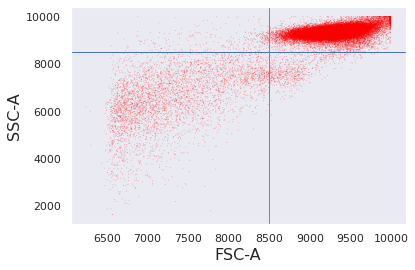

In [ ]:
# figure()
# y2_gate=ThresholdGate(8500.0, ['SSC-A'], region='above')
# x2_gate=ThresholdGate(8500.0, ['FSC-A'], region='above')
# tsample.plot(['FSC-A','SSC-A'],kind='scatter',gates=[y2_gate, x2_gate], color='red', s=1, alpha=.3)

In [ ]:
# figure()
# # y2_gate=PolyGate(8500.0, ['SSC-A'], region='above')
# # x2_gate=ThresholdGate(8500.0, ['FSC-A'], region='above')
# # tsample.plot(['FSC-A','SSC-A'],kind='scatter',gates=[y2_gate, x2_gate], color='red', s=1, alpha=.3)
# gate=PolyGate(8500.0, ['SSC-A'], region=('8500','9500'))
# tsample.plot(['FSC-A','SSC-A'],kind='scatter',gate=gate, color='red', s=1, alpha=.3)

AttributeError: ignored

<Figure size 432x288 with 0 Axes>

In [ ]:
# print('kmeans: {}'.format(silhouette_score(data1_kmeans, kmeans.labels_, metric='euclidean')))
# print('Cosine kmeans:{}'.format(silhouette_score(normalized_vectors, normalized_kmeans.labels_, metric='cosine')))
# print('DBSCAN: {}'.format(silhouette_score(data1_kmeans, dbscan.labels_, metric='cosine')))

In [ ]:
# X, y = make_blobs(
#     n_samples=500,
#     n_features=2,
#     centers=4,
#     cluster_std=1,
#     center_box=(-10.0, 10.0),
#     shuffle=True,
#     random_state=1,
# )  # For reproducibility

NameError: ignored

In [ ]:
X.shape,data1_kmeans.shape

((500, 2), (51812, 7))

For n_clusters = 2 The average silhouette_score is : 0.4305892


NameError: ignored

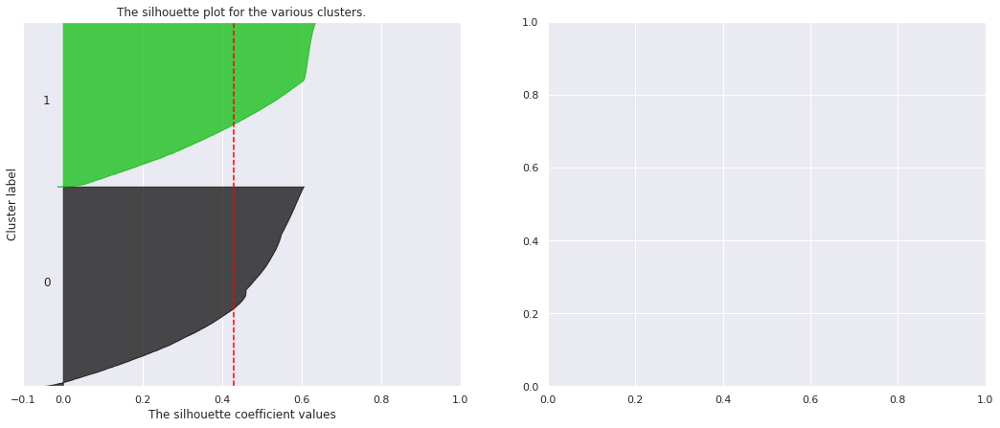

In [ ]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Generating the sample data from make_blobs
# This particular setting has one distinct cluster and 3 clusters placed close
# together.
# #X, y = make_blobs(
#     n_samples=500,
#     n_features=2,
#     centers=4,
#     cluster_std=1,
#     center_box=(-10.0, 10.0),
#     shuffle=True,
#     random_state=1,
# )  # For reproducibility

range_n_clusters = [5, 6,7,8,9,10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(data1_kmeans) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(data1_kmeans)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(data1_kmeans, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(data1_kmeans, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        data1_kmeans[:, 0], data1_kmeans[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

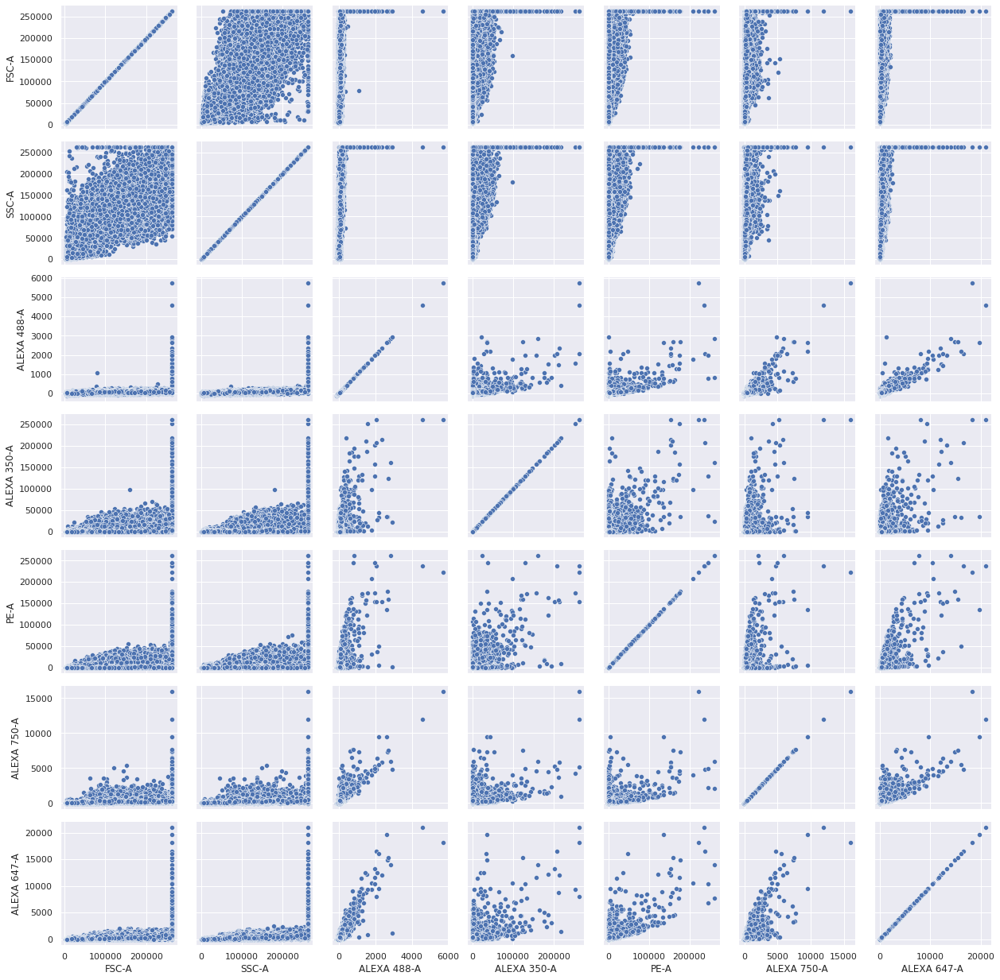

In [ ]:
g = sns.PairGrid(data1_kmeans)
g.map(sns.scatterplot)
plt.show()

ValueError: ignored

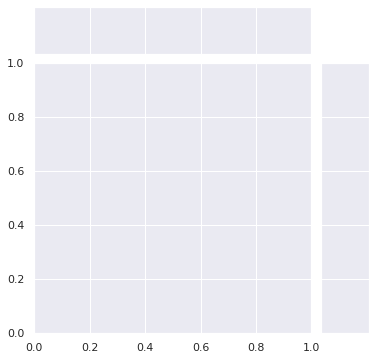